In [26]:
import sys
from pathlib import Path

PROJECT_ROOT = Path.cwd().parent
sys.path.insert(0, str(PROJECT_ROOT))

import tensorflow as tf
import matplotlib.pyplot as plt
from architectures import CNNUpscaler
from image_processing import downscale, load_and_preprocess, load_image_paths

# -----------------------------
# Configuración
# -----------------------------
UP_RATIO = 2
BATCH_SIZE = 32
EPOCHS = 100          # puedes subirlo cuando tengas GPU
HR_SIZE = (256, 256)  # tamaño de imagen HR para entrenamiento
DATA_FOLDER = "../../data/DIV2K_train_HR"  # ruta a tu dataset de imágenes HR
VALID_FOLDER = "../../data/DIV2K_valid_HR"  # ruta a tu dataset de imágenes HR

In [ ]:
print("GPUs visibles:", tf.config.list_physical_devices("GPU"))

In [22]:
# -----------------------------
# Generador de datos
# -----------------------------
def build_dataset(image_paths, hr_size, up_ratio, batch_size, training=True):
    ds = tf.data.Dataset.from_tensor_slices(image_paths)

    if training:
        ds = ds.shuffle(buffer_size=len(image_paths))

    ds = ds.map(
        lambda p: load_and_preprocess(p, hr_size, up_ratio),
        num_parallel_calls=tf.data.AUTOTUNE
    )

    ds = ds.batch(batch_size, drop_remainder=True)
    ds = ds.prefetch(tf.data.AUTOTUNE)

    return ds

# -----------------------------
# Mostrar imagenes predecidas por el modelo
# -----------------------------

def show_example(model, dataset, image_path=None, hr_size=(256, 256), up_ratio=4):
    """
    Muestra un ejemplo de la imagen desde la ruta de archivo(si se proporciona, sino se escoge de maenra aleatoria): LR → SR → HR
    """
    # Si `image_path` se proporciona, cargar esa imagen
    if image_path is not None:
        lr, hr = load_and_preprocess(image_path, hr_size, up_ratio)
        # Añadir dimensión de batch para que sea (1, h, w, 3)
        lr = tf.expand_dims(lr, axis=0)
        
    else:
        # Si no se proporciona, tomar una imagen aleatoria del dataset
        for lr_batch, hr_batch in dataset.take(1):
            lr = lr_batch[0:1]   # Seleccionar la primera imagen del lote
            hr = hr_batch[0]     # Seleccionar la primera imagen del lote
            

    # Predicción
    sr = model(lr, training=False)[0]

    # Convertir a numpy para visualización
    lr_np = lr[0].numpy()
    sr_np = sr.numpy()
    hr_np = hr.numpy()

    # Mostrar imágenes
    plt.figure(figsize=(12, 4))

    plt.subplot(1, 3, 1)
    plt.title("Low Res (Input)")
    plt.imshow(lr_np)
    plt.axis("off")

    plt.subplot(1, 3, 2)
    plt.title("Super Res (Prediction)")
    plt.imshow(sr_np)
    plt.axis("off")

    plt.subplot(1, 3, 3)
    plt.title("High Res (Target)")
    plt.imshow(hr_np)
    plt.axis("off")

    plt.show()

def psnr(y_true, y_pred):
    return tf.image.psnr(y_true, y_pred, max_val=1.0)

def ssim(y_true, y_pred):
    return tf.image.ssim(y_true, y_pred, max_val=1.0)

class ShowExampleCallback(tf.keras.callbacks.Callback):

    def __init__(
        self,
        dataset,
        every_n_epochs=1,
        image_path=None,
        hr_size=(256, 256),
        up_ratio=4,
        num_examples=1
    ):
        super().__init__()
        self.dataset = dataset
        self.every_n_epochs = every_n_epochs
        self.image_path = image_path
        self.hr_size = hr_size
        self.up_ratio = up_ratio
        self.num_examples = num_examples

    def on_epoch_end(self, epoch, logs=None):
        current_epoch = epoch + 1

        if current_epoch % self.every_n_epochs != 0:
            return

        print(f"\nExample in epoch {current_epoch}\n")

        for _ in range(self.num_examples):
            show_example(
                model=self.model,
                dataset=self.dataset,
                image_path=self.image_path,
                hr_size=self.hr_size,
                up_ratio=self.up_ratio
            )

/home/rupar/enhance-ai/venv/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'cnnupscaler', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(


Model: "cnnupscaler"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ upscaler (Upscaler)             │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_27 (Conv2D)              │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_28 (Conv2D)              │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_29 (Conv2D)              │ ?                      │   0 (unbuilt) │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 0 (0.00 B)

 Trainable params: 0 (0.00 B)

 Non-trainable params: 0 (0.00 B)

Epoch 1/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 6s 169ms/step - loss: 0.0571 - psnr: 21.8851 - ssim: 0.7446 - val_loss: 0.0476 - val_psnr: 22.6350 - val_ssim: 0.7540
Epoch 2/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 4s 165ms/step - loss: 0.0456 - psnr: 22.8090 - ssim: 0.7557 - val_loss: 0.0455 - val_psnr: 22.7930 - val_ssim: 0.7578
Epoch 3/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 4s 156ms/step - loss: 0.0446 - psnr: 22.9219 - ssim: 0.7595 - val_loss: 0.0448 - val_psnr: 22.9149 - val_ssim: 0.7619
Epoch 4/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 4s 153ms/step - loss: 0.0442 - psnr: 23.0134 - ssim: 0.7634 - val_loss: 0.0446 - val_psnr: 22.9771 - val_ssim: 0.7644
Epoch 5/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step - loss: 0.0446 - psnr: 22.9959 - ssim: 0.7638
Example in epoch 5



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.033607118..1.0112134].


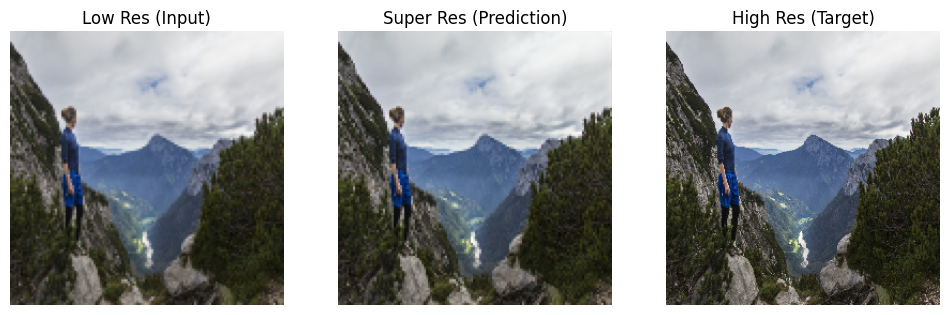

25/25 ━━━━━━━━━━━━━━━━━━━━ 5s 182ms/step - loss: 0.0440 - psnr: 23.0683 - ssim: 0.7655 - val_loss: 0.0447 - val_psnr: 23.0315 - val_ssim: 0.7672
Epoch 6/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 4s 163ms/step - loss: 0.0440 - psnr: 23.1154 - ssim: 0.7672 - val_loss: 0.0443 - val_psnr: 23.0906 - val_ssim: 0.7684
Epoch 7/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 4s 157ms/step - loss: 0.0438 - psnr: 23.1592 - ssim: 0.7684 - val_loss: 0.0440 - val_psnr: 23.1506 - val_ssim: 0.7699
Epoch 8/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 4s 150ms/step - loss: 0.0434 - psnr: 23.2402 - ssim: 0.7708 - val_loss: 0.0436 - val_psnr: 23.2423 - val_ssim: 0.7729
Epoch 9/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 4s 154ms/step - loss: 0.0430 - psnr: 23.3271 - ssim: 0.7736 - val_loss: 0.0433 - val_psnr: 23.3161 - val_ssim: 0.7755
Epoch 10/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step - loss: 0.0431 - psnr: 23.2751 - ssim: 0.7740
Example in epoch 10



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.018472694..1.0445844].


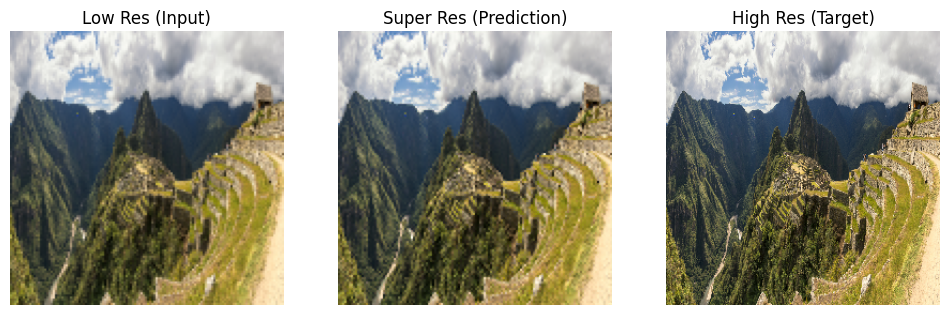

25/25 ━━━━━━━━━━━━━━━━━━━━ 4s 170ms/step - loss: 0.0428 - psnr: 23.3739 - ssim: 0.7752 - val_loss: 0.0432 - val_psnr: 23.3560 - val_ssim: 0.7765
Epoch 11/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 4s 173ms/step - loss: 0.0427 - psnr: 23.4016 - ssim: 0.7759 - val_loss: 0.0431 - val_psnr: 23.3696 - val_ssim: 0.7773
Epoch 12/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 4s 167ms/step - loss: 0.0426 - psnr: 23.4219 - ssim: 0.7766 - val_loss: 0.0430 - val_psnr: 23.3930 - val_ssim: 0.7775
Epoch 13/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 4s 149ms/step - loss: 0.0425 - psnr: 23.4435 - ssim: 0.7771 - val_loss: 0.0429 - val_psnr: 23.4277 - val_ssim: 0.7782
Epoch 14/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 4s 146ms/step - loss: 0.0425 - psnr: 23.4623 - ssim: 0.7776 - val_loss: 0.0428 - val_psnr: 23.4370 - val_ssim: 0.7781
Epoch 15/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step - loss: 0.0434 - psnr: 23.2944 - ssim: 0.7724
Example in epoch 15



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.04613233..1.0550436].


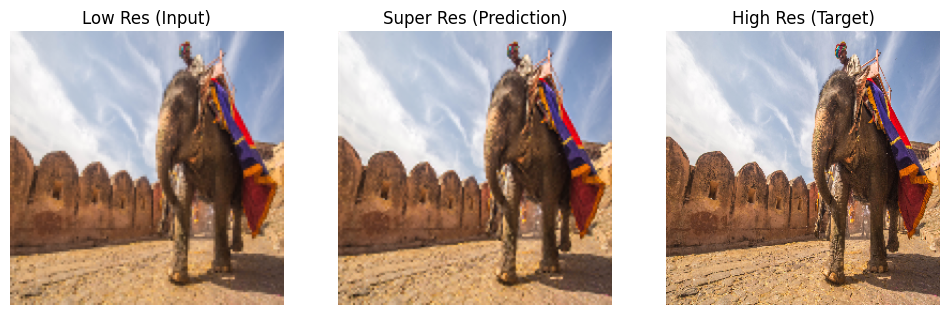

25/25 ━━━━━━━━━━━━━━━━━━━━ 4s 165ms/step - loss: 0.0425 - psnr: 23.4765 - ssim: 0.7779 - val_loss: 0.0429 - val_psnr: 23.4417 - val_ssim: 0.7794
Epoch 16/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 4s 148ms/step - loss: 0.0425 - psnr: 23.4864 - ssim: 0.7782 - val_loss: 0.0427 - val_psnr: 23.4740 - val_ssim: 0.7794
Epoch 17/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 4s 145ms/step - loss: 0.0422 - psnr: 23.5154 - ssim: 0.7790 - val_loss: 0.0427 - val_psnr: 23.4894 - val_ssim: 0.7799
Epoch 18/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 4s 148ms/step - loss: 0.0422 - psnr: 23.5281 - ssim: 0.7794 - val_loss: 0.0426 - val_psnr: 23.4938 - val_ssim: 0.7796
Epoch 19/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 4s 145ms/step - loss: 0.0421 - psnr: 23.5434 - ssim: 0.7799 - val_loss: 0.0424 - val_psnr: 23.5318 - val_ssim: 0.7813
Epoch 20/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step - loss: 0.0423 - psnr: 23.5551 - ssim: 0.7763
Example in epoch 20



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.08255122..1.0739067].


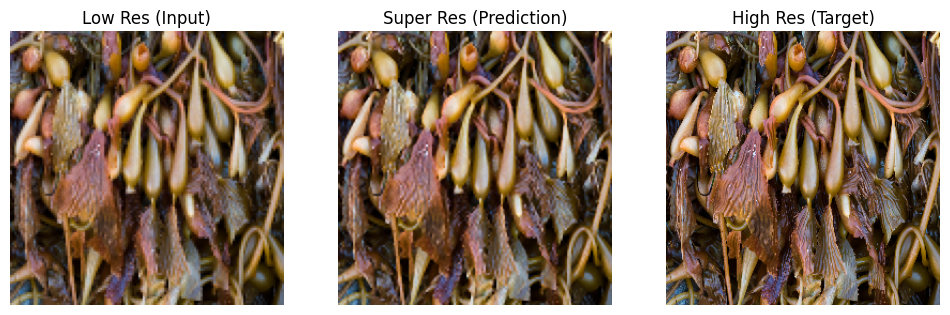

25/25 ━━━━━━━━━━━━━━━━━━━━ 4s 167ms/step - loss: 0.0419 - psnr: 23.5662 - ssim: 0.7804 - val_loss: 0.0423 - val_psnr: 23.5508 - val_ssim: 0.7816
Epoch 21/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 4s 146ms/step - loss: 0.0418 - psnr: 23.5825 - ssim: 0.7809 - val_loss: 0.0422 - val_psnr: 23.5660 - val_ssim: 0.7819
Epoch 22/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 4s 146ms/step - loss: 0.0418 - psnr: 23.5969 - ssim: 0.7813 - val_loss: 0.0423 - val_psnr: 23.5771 - val_ssim: 0.7824
Epoch 23/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 4s 148ms/step - loss: 0.0419 - psnr: 23.6008 - ssim: 0.7814 - val_loss: 0.0423 - val_psnr: 23.5886 - val_ssim: 0.7826
Epoch 24/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 4s 147ms/step - loss: 0.0418 - psnr: 23.6126 - ssim: 0.7816 - val_loss: 0.0421 - val_psnr: 23.6037 - val_ssim: 0.7829
Epoch 25/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step - loss: 0.0417 - psnr: 23.5976 - ssim: 0.7819
Example in epoch 25



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.04419697..1.0624747].


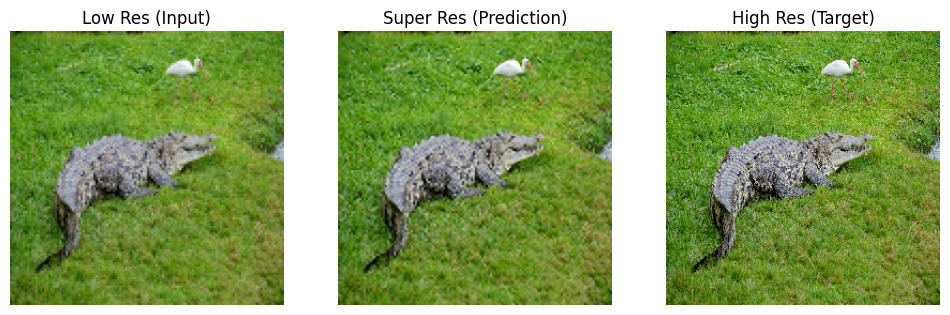

25/25 ━━━━━━━━━━━━━━━━━━━━ 5s 178ms/step - loss: 0.0416 - psnr: 23.6260 - ssim: 0.7820 - val_loss: 0.0420 - val_psnr: 23.6114 - val_ssim: 0.7831
Epoch 26/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 4s 156ms/step - loss: 0.0416 - psnr: 23.6332 - ssim: 0.7823 - val_loss: 0.0420 - val_psnr: 23.6218 - val_ssim: 0.7834
Epoch 27/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 4s 154ms/step - loss: 0.0416 - psnr: 23.6409 - ssim: 0.7825 - val_loss: 0.0421 - val_psnr: 23.6272 - val_ssim: 0.7841
Epoch 28/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 4s 154ms/step - loss: 0.0416 - psnr: 23.6461 - ssim: 0.7826 - val_loss: 0.0419 - val_psnr: 23.6368 - val_ssim: 0.7841
Epoch 29/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 4s 154ms/step - loss: 0.0415 - psnr: 23.6511 - ssim: 0.7828 - val_loss: 0.0419 - val_psnr: 23.6404 - val_ssim: 0.7839
Epoch 30/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step - loss: 0.0413 - psnr: 23.7191 - ssim: 0.7834
Example in epoch 30



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.0024449006..0.9901549].


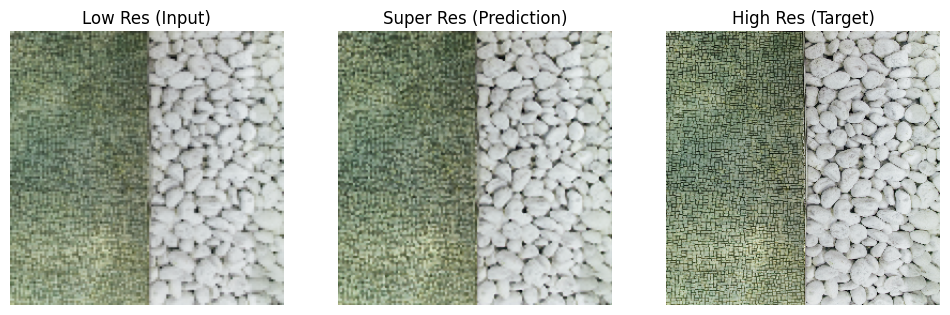

25/25 ━━━━━━━━━━━━━━━━━━━━ 4s 172ms/step - loss: 0.0415 - psnr: 23.6554 - ssim: 0.7830 - val_loss: 0.0420 - val_psnr: 23.6412 - val_ssim: 0.7846
Epoch 31/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 4s 153ms/step - loss: 0.0416 - psnr: 23.6558 - ssim: 0.7830 - val_loss: 0.0419 - val_psnr: 23.6529 - val_ssim: 0.7836
Epoch 32/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 4s 150ms/step - loss: 0.0414 - psnr: 23.6673 - ssim: 0.7832 - val_loss: 0.0418 - val_psnr: 23.6588 - val_ssim: 0.7846
Epoch 33/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 4s 151ms/step - loss: 0.0414 - psnr: 23.6724 - ssim: 0.7835 - val_loss: 0.0418 - val_psnr: 23.6649 - val_ssim: 0.7843
Epoch 34/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 4s 153ms/step - loss: 0.0414 - psnr: 23.6745 - ssim: 0.7835 - val_loss: 0.0419 - val_psnr: 23.6658 - val_ssim: 0.7850
Epoch 35/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step - loss: 0.0423 - psnr: 23.5508 - ssim: 0.7808
Example in epoch 35



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.069329716..1.0574183].


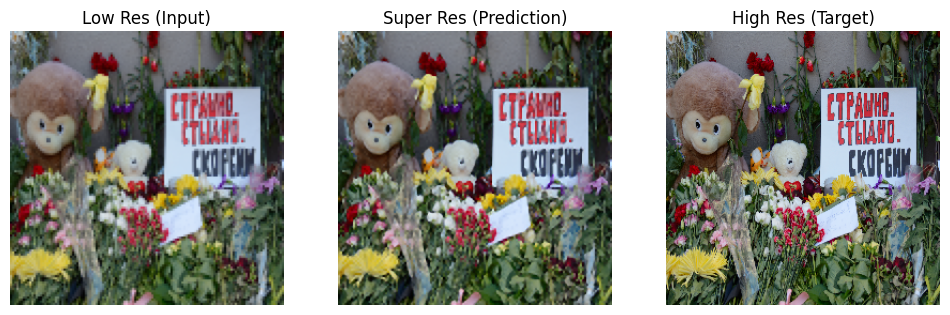

25/25 ━━━━━━━━━━━━━━━━━━━━ 4s 170ms/step - loss: 0.0414 - psnr: 23.6788 - ssim: 0.7836 - val_loss: 0.0417 - val_psnr: 23.6755 - val_ssim: 0.7852
Epoch 36/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 4s 149ms/step - loss: 0.0413 - psnr: 23.6853 - ssim: 0.7839 - val_loss: 0.0417 - val_psnr: 23.6826 - val_ssim: 0.7850
Epoch 37/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 4s 152ms/step - loss: 0.0413 - psnr: 23.6906 - ssim: 0.7840 - val_loss: 0.0417 - val_psnr: 23.6848 - val_ssim: 0.7855
Epoch 38/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 4s 149ms/step - loss: 0.0413 - psnr: 23.6929 - ssim: 0.7841 - val_loss: 0.0417 - val_psnr: 23.6829 - val_ssim: 0.7849
Epoch 39/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 4s 149ms/step - loss: 0.0413 - psnr: 23.6964 - ssim: 0.7842 - val_loss: 0.0416 - val_psnr: 23.6943 - val_ssim: 0.7856
Epoch 40/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step - loss: 0.0419 - psnr: 23.5223 - ssim: 0.7806
Example in epoch 40



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.12530649..1.1479456].


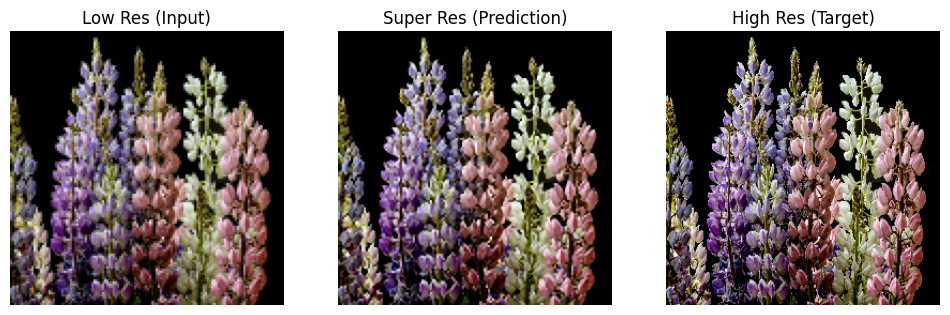

25/25 ━━━━━━━━━━━━━━━━━━━━ 4s 170ms/step - loss: 0.0412 - psnr: 23.7020 - ssim: 0.7844 - val_loss: 0.0416 - val_psnr: 23.6979 - val_ssim: 0.7862
Epoch 41/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 4s 152ms/step - loss: 0.0413 - psnr: 23.7011 - ssim: 0.7843 - val_loss: 0.0416 - val_psnr: 23.7011 - val_ssim: 0.7856
Epoch 42/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 4s 153ms/step - loss: 0.0412 - psnr: 23.7079 - ssim: 0.7846 - val_loss: 0.0416 - val_psnr: 23.7082 - val_ssim: 0.7859
Epoch 43/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 4s 166ms/step - loss: 0.0413 - psnr: 23.7066 - ssim: 0.7844 - val_loss: 0.0416 - val_psnr: 23.7107 - val_ssim: 0.7863
Epoch 44/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 4s 153ms/step - loss: 0.0412 - psnr: 23.7105 - ssim: 0.7846 - val_loss: 0.0415 - val_psnr: 23.7148 - val_ssim: 0.7862
Epoch 45/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step - loss: 0.0407 - psnr: 23.7340 - ssim: 0.7865
Example in epoch 45



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.0067126923..1.0478152].


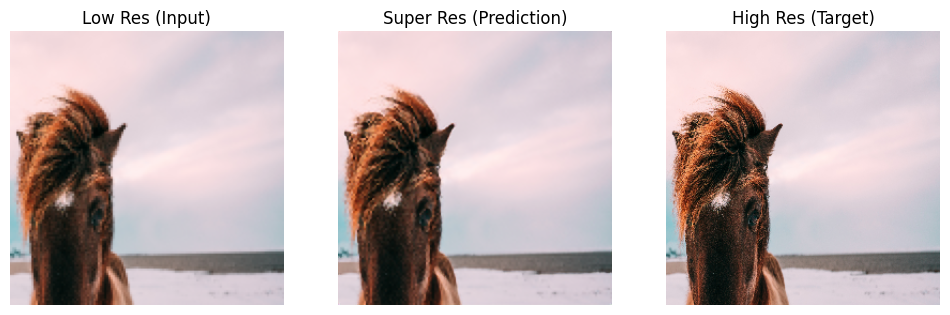

25/25 ━━━━━━━━━━━━━━━━━━━━ 4s 169ms/step - loss: 0.0412 - psnr: 23.7152 - ssim: 0.7847 - val_loss: 0.0415 - val_psnr: 23.7112 - val_ssim: 0.7860
Epoch 46/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 4s 150ms/step - loss: 0.0412 - psnr: 23.7158 - ssim: 0.7848 - val_loss: 0.0415 - val_psnr: 23.7200 - val_ssim: 0.7861
Epoch 47/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 4s 150ms/step - loss: 0.0413 - psnr: 23.7146 - ssim: 0.7848 - val_loss: 0.0415 - val_psnr: 23.7239 - val_ssim: 0.7862
Epoch 48/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 4s 152ms/step - loss: 0.0412 - psnr: 23.7205 - ssim: 0.7849 - val_loss: 0.0414 - val_psnr: 23.7276 - val_ssim: 0.7864
Epoch 49/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 4s 149ms/step - loss: 0.0411 - psnr: 23.7275 - ssim: 0.7852 - val_loss: 0.0414 - val_psnr: 23.7337 - val_ssim: 0.7866
Epoch 50/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step - loss: 0.0405 - psnr: 23.8163 - ssim: 0.7883
Example in epoch 50



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.02788676..1.0323316].


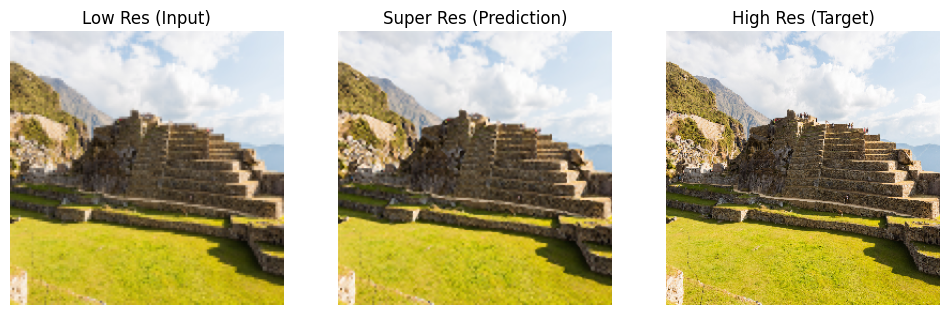

25/25 ━━━━━━━━━━━━━━━━━━━━ 4s 175ms/step - loss: 0.0411 - psnr: 23.7306 - ssim: 0.7852 - val_loss: 0.0414 - val_psnr: 23.7377 - val_ssim: 0.7869
Epoch 51/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 4s 149ms/step - loss: 0.0410 - psnr: 23.7332 - ssim: 0.7854 - val_loss: 0.0414 - val_psnr: 23.7390 - val_ssim: 0.7869
Epoch 52/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 4s 149ms/step - loss: 0.0410 - psnr: 23.7361 - ssim: 0.7854 - val_loss: 0.0414 - val_psnr: 23.7427 - val_ssim: 0.7870
Epoch 53/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 4s 147ms/step - loss: 0.0410 - psnr: 23.7376 - ssim: 0.7855 - val_loss: 0.0414 - val_psnr: 23.7482 - val_ssim: 0.7871
Epoch 54/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 4s 150ms/step - loss: 0.0410 - psnr: 23.7405 - ssim: 0.7856 - val_loss: 0.0414 - val_psnr: 23.7464 - val_ssim: 0.7867
Epoch 55/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step - loss: 0.0409 - psnr: 23.6834 - ssim: 0.7857
Example in epoch 55



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.06892329..1.0795772].


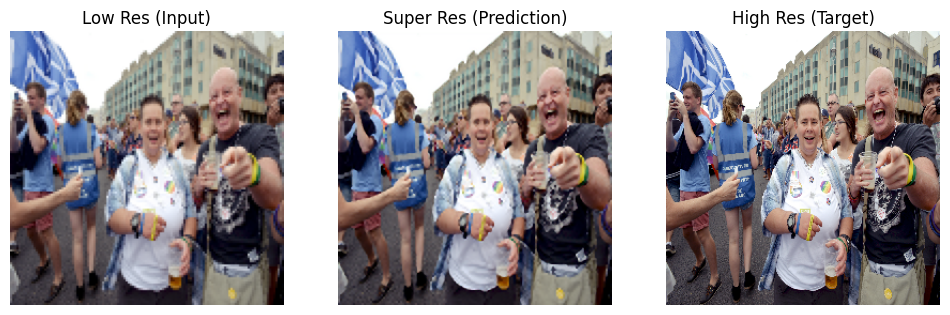

25/25 ━━━━━━━━━━━━━━━━━━━━ 4s 170ms/step - loss: 0.0410 - psnr: 23.7421 - ssim: 0.7856 - val_loss: 0.0413 - val_psnr: 23.7534 - val_ssim: 0.7873
Epoch 56/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 4s 150ms/step - loss: 0.0410 - psnr: 23.7453 - ssim: 0.7857 - val_loss: 0.0413 - val_psnr: 23.7582 - val_ssim: 0.7874
Epoch 57/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 4s 148ms/step - loss: 0.0410 - psnr: 23.7469 - ssim: 0.7858 - val_loss: 0.0413 - val_psnr: 23.7596 - val_ssim: 0.7878
Epoch 58/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 4s 147ms/step - loss: 0.0410 - psnr: 23.7498 - ssim: 0.7858 - val_loss: 0.0412 - val_psnr: 23.7616 - val_ssim: 0.7874
Epoch 59/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 4s 147ms/step - loss: 0.0409 - psnr: 23.7527 - ssim: 0.7860 - val_loss: 0.0412 - val_psnr: 23.7615 - val_ssim: 0.7871
Epoch 60/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step - loss: 0.0396 - psnr: 24.0234 - ssim: 0.7950
Example in epoch 60



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.00028331578..1.0743164].


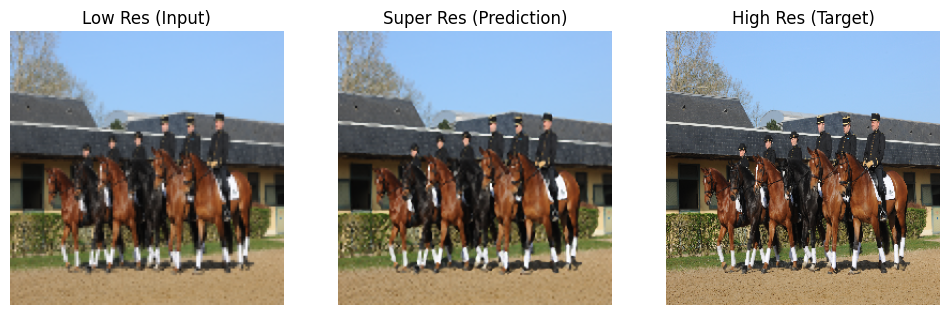

25/25 ━━━━━━━━━━━━━━━━━━━━ 4s 170ms/step - loss: 0.0409 - psnr: 23.7543 - ssim: 0.7860 - val_loss: 0.0413 - val_psnr: 23.7652 - val_ssim: 0.7881
Epoch 61/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 4s 148ms/step - loss: 0.0410 - psnr: 23.7523 - ssim: 0.7859 - val_loss: 0.0412 - val_psnr: 23.7682 - val_ssim: 0.7879
Epoch 62/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 4s 151ms/step - loss: 0.0409 - psnr: 23.7575 - ssim: 0.7861 - val_loss: 0.0412 - val_psnr: 23.7716 - val_ssim: 0.7882
Epoch 63/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 4s 149ms/step - loss: 0.0409 - psnr: 23.7605 - ssim: 0.7863 - val_loss: 0.0412 - val_psnr: 23.7730 - val_ssim: 0.7881
Epoch 64/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 4s 149ms/step - loss: 0.0409 - psnr: 23.7617 - ssim: 0.7863 - val_loss: 0.0412 - val_psnr: 23.7702 - val_ssim: 0.7871
Epoch 65/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step - loss: 0.0419 - psnr: 23.6524 - ssim: 0.7812
Example in epoch 65



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.0906895..1.1077226].


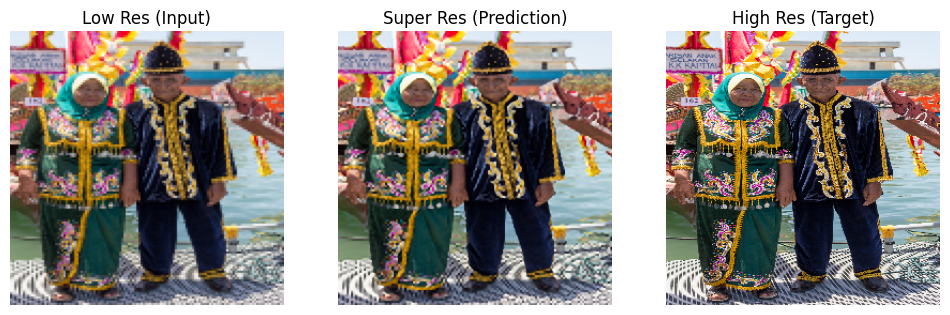

25/25 ━━━━━━━━━━━━━━━━━━━━ 4s 168ms/step - loss: 0.0409 - psnr: 23.7614 - ssim: 0.7862 - val_loss: 0.0412 - val_psnr: 23.7744 - val_ssim: 0.7877
Epoch 66/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 4s 150ms/step - loss: 0.0409 - psnr: 23.7633 - ssim: 0.7863 - val_loss: 0.0412 - val_psnr: 23.7711 - val_ssim: 0.7870
Epoch 67/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 4s 148ms/step - loss: 0.0409 - psnr: 23.7660 - ssim: 0.7863 - val_loss: 0.0413 - val_psnr: 23.7725 - val_ssim: 0.7878
Epoch 68/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 4s 148ms/step - loss: 0.0409 - psnr: 23.7665 - ssim: 0.7865 - val_loss: 0.0411 - val_psnr: 23.7845 - val_ssim: 0.7882
Epoch 69/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 4s 151ms/step - loss: 0.0409 - psnr: 23.7677 - ssim: 0.7864 - val_loss: 0.0411 - val_psnr: 23.7835 - val_ssim: 0.7881
Epoch 70/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step - loss: 0.0405 - psnr: 23.8433 - ssim: 0.7887
Example in epoch 70



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.032265283..1.0792177].


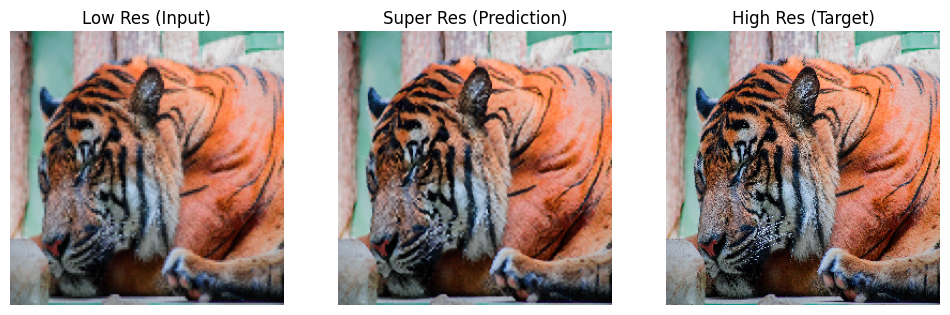

25/25 ━━━━━━━━━━━━━━━━━━━━ 4s 170ms/step - loss: 0.0409 - psnr: 23.7687 - ssim: 0.7864 - val_loss: 0.0411 - val_psnr: 23.7816 - val_ssim: 0.7879
Epoch 71/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 4s 149ms/step - loss: 0.0408 - psnr: 23.7729 - ssim: 0.7866 - val_loss: 0.0411 - val_psnr: 23.7900 - val_ssim: 0.7889
Epoch 72/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 4s 148ms/step - loss: 0.0408 - psnr: 23.7736 - ssim: 0.7867 - val_loss: 0.0411 - val_psnr: 23.7899 - val_ssim: 0.7886
Epoch 73/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 4s 151ms/step - loss: 0.0408 - psnr: 23.7763 - ssim: 0.7868 - val_loss: 0.0410 - val_psnr: 23.7938 - val_ssim: 0.7880
Epoch 74/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 4s 148ms/step - loss: 0.0408 - psnr: 23.7786 - ssim: 0.7868 - val_loss: 0.0410 - val_psnr: 23.7962 - val_ssim: 0.7888
Epoch 75/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step - loss: 0.0407 - psnr: 23.8604 - ssim: 0.7870
Example in epoch 75



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.08526223..1.110249].


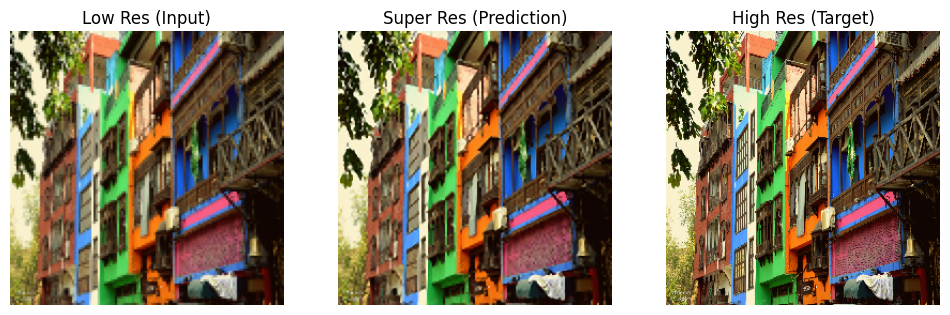

25/25 ━━━━━━━━━━━━━━━━━━━━ 4s 172ms/step - loss: 0.0407 - psnr: 23.7804 - ssim: 0.7869 - val_loss: 0.0410 - val_psnr: 23.7983 - val_ssim: 0.7888
Epoch 76/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 4s 150ms/step - loss: 0.0407 - psnr: 23.7817 - ssim: 0.7869 - val_loss: 0.0410 - val_psnr: 23.7962 - val_ssim: 0.7884
Epoch 77/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 4s 150ms/step - loss: 0.0407 - psnr: 23.7810 - ssim: 0.7869 - val_loss: 0.0410 - val_psnr: 23.7991 - val_ssim: 0.7890
Epoch 78/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 4s 150ms/step - loss: 0.0407 - psnr: 23.7809 - ssim: 0.7869 - val_loss: 0.0411 - val_psnr: 23.7906 - val_ssim: 0.7892
Epoch 79/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 4s 147ms/step - loss: 0.0407 - psnr: 23.7828 - ssim: 0.7869 - val_loss: 0.0410 - val_psnr: 23.7973 - val_ssim: 0.7882
Epoch 80/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step - loss: 0.0416 - psnr: 23.6225 - ssim: 0.7826
Example in epoch 80



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.020749599..1.0148623].


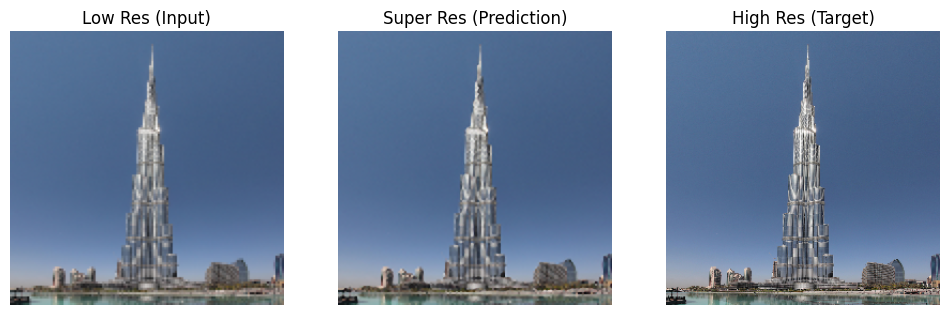

25/25 ━━━━━━━━━━━━━━━━━━━━ 4s 170ms/step - loss: 0.0407 - psnr: 23.7849 - ssim: 0.7869 - val_loss: 0.0410 - val_psnr: 23.8013 - val_ssim: 0.7886
Epoch 81/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 4s 150ms/step - loss: 0.0407 - psnr: 23.7839 - ssim: 0.7869 - val_loss: 0.0410 - val_psnr: 23.8015 - val_ssim: 0.7892
Epoch 82/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 4s 148ms/step - loss: 0.0407 - psnr: 23.7874 - ssim: 0.7870 - val_loss: 0.0410 - val_psnr: 23.8056 - val_ssim: 0.7890
Epoch 83/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 4s 147ms/step - loss: 0.0407 - psnr: 23.7889 - ssim: 0.7871 - val_loss: 0.0410 - val_psnr: 23.8074 - val_ssim: 0.7888
Epoch 84/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 4s 151ms/step - loss: 0.0407 - psnr: 23.7890 - ssim: 0.7871 - val_loss: 0.0410 - val_psnr: 23.8020 - val_ssim: 0.7880
Epoch 85/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step - loss: 0.0409 - psnr: 23.6755 - ssim: 0.7854
Example in epoch 85



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.0022261813..1.0310237].


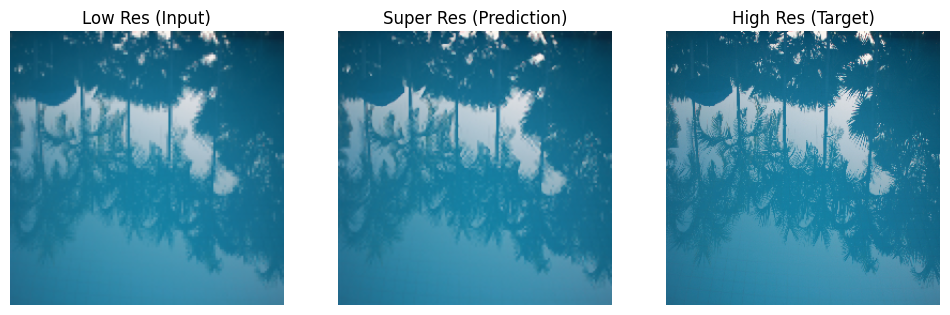

25/25 ━━━━━━━━━━━━━━━━━━━━ 4s 168ms/step - loss: 0.0407 - psnr: 23.7875 - ssim: 0.7871 - val_loss: 0.0410 - val_psnr: 23.8101 - val_ssim: 0.7885
Epoch 86/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 4s 150ms/step - loss: 0.0407 - psnr: 23.7914 - ssim: 0.7871 - val_loss: 0.0409 - val_psnr: 23.8102 - val_ssim: 0.7885
Epoch 87/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 4s 150ms/step - loss: 0.0407 - psnr: 23.7930 - ssim: 0.7873 - val_loss: 0.0409 - val_psnr: 23.8120 - val_ssim: 0.7889
Epoch 88/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 4s 149ms/step - loss: 0.0406 - psnr: 23.7951 - ssim: 0.7873 - val_loss: 0.0410 - val_psnr: 23.8079 - val_ssim: 0.7893
Epoch 89/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 4s 149ms/step - loss: 0.0407 - psnr: 23.7942 - ssim: 0.7873 - val_loss: 0.0410 - val_psnr: 23.8135 - val_ssim: 0.7889
Epoch 90/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step - loss: 0.0410 - psnr: 23.7979 - ssim: 0.7851
Example in epoch 90



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.04000156..0.9472289].


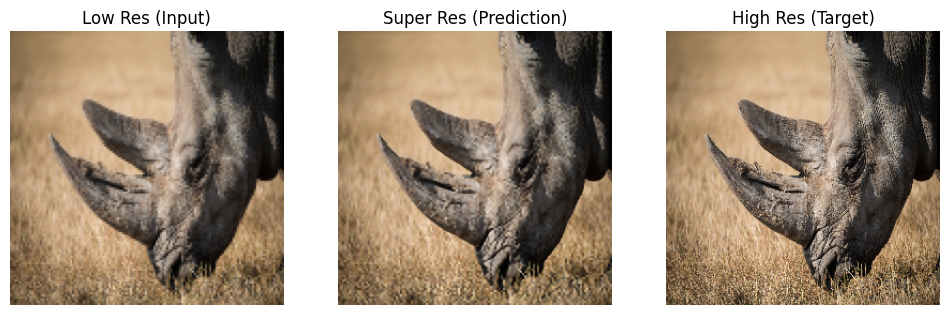

25/25 ━━━━━━━━━━━━━━━━━━━━ 4s 176ms/step - loss: 0.0407 - psnr: 23.7957 - ssim: 0.7873 - val_loss: 0.0409 - val_psnr: 23.8137 - val_ssim: 0.7887
Epoch 91/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 4s 150ms/step - loss: 0.0406 - psnr: 23.7991 - ssim: 0.7875 - val_loss: 0.0409 - val_psnr: 23.8056 - val_ssim: 0.7884
Epoch 92/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 4s 157ms/step - loss: 0.0406 - psnr: 23.7975 - ssim: 0.7874 - val_loss: 0.0409 - val_psnr: 23.8192 - val_ssim: 0.7895
Epoch 93/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 4s 159ms/step - loss: 0.0406 - psnr: 23.8006 - ssim: 0.7875 - val_loss: 0.0409 - val_psnr: 23.8197 - val_ssim: 0.7885
Epoch 94/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 4s 151ms/step - loss: 0.0406 - psnr: 23.8017 - ssim: 0.7875 - val_loss: 0.0409 - val_psnr: 23.8218 - val_ssim: 0.7897
Epoch 95/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step - loss: 0.0399 - psnr: 23.9359 - ssim: 0.7879
Example in epoch 95



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.02037336..1.1368761].


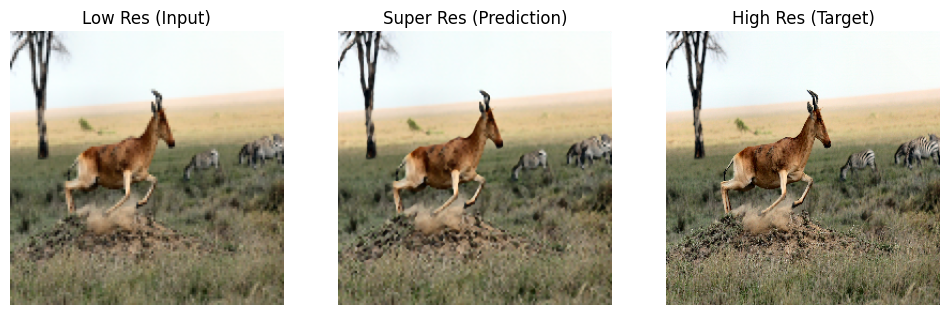

25/25 ━━━━━━━━━━━━━━━━━━━━ 4s 170ms/step - loss: 0.0406 - psnr: 23.8031 - ssim: 0.7876 - val_loss: 0.0409 - val_psnr: 23.8233 - val_ssim: 0.7895
Epoch 96/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 4s 148ms/step - loss: 0.0406 - psnr: 23.8025 - ssim: 0.7874 - val_loss: 0.0409 - val_psnr: 23.8180 - val_ssim: 0.7889
Epoch 97/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 4s 148ms/step - loss: 0.0406 - psnr: 23.8031 - ssim: 0.7876 - val_loss: 0.0408 - val_psnr: 23.8262 - val_ssim: 0.7895
Epoch 98/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 4s 150ms/step - loss: 0.0406 - psnr: 23.8065 - ssim: 0.7877 - val_loss: 0.0408 - val_psnr: 23.8283 - val_ssim: 0.7890
Epoch 99/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 4s 149ms/step - loss: 0.0406 - psnr: 23.8060 - ssim: 0.7877 - val_loss: 0.0409 - val_psnr: 23.8212 - val_ssim: 0.7886
Epoch 100/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step - loss: 0.0407 - psnr: 23.8354 - ssim: 0.7865
Example in epoch 100



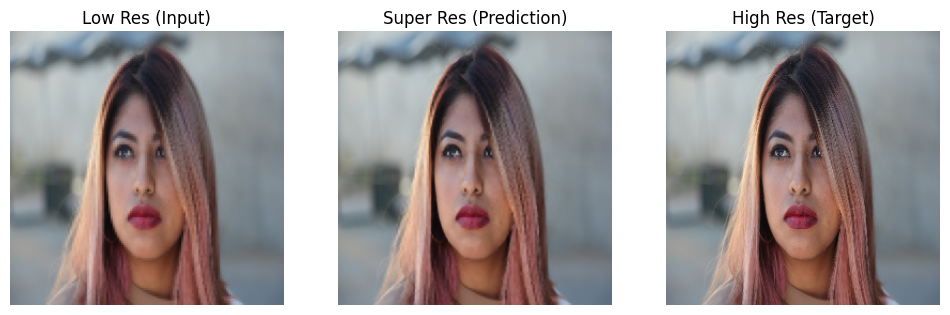

25/25 ━━━━━━━━━━━━━━━━━━━━ 4s 169ms/step - loss: 0.0406 - psnr: 23.8066 - ssim: 0.7876 - val_loss: 0.0408 - val_psnr: 23.8274 - val_ssim: 0.7892


In [27]:
# -----------------------------
# Crear y compilar modelo
# -----------------------------
model = CNNUpscaler(up_ratio=UP_RATIO)
model.build((None, None, None, 3))
model.compile(optimizer="adam", loss="mae", metrics=[psnr, ssim], jit_compile=False)

model.summary()

# -----------------------------
# Entrenamiento
# -----------------------------

train_paths = load_image_paths(DATA_FOLDER)
val_paths   = load_image_paths(VALID_FOLDER)

train_ds = build_dataset(train_paths, HR_SIZE, UP_RATIO, BATCH_SIZE, training=True)
val_ds = build_dataset(val_paths, HR_SIZE, UP_RATIO, BATCH_SIZE, training=False)

val_ds = val_ds.cache()

show_cb = ShowExampleCallback(
    dataset=train_ds,
    every_n_epochs=5,
    up_ratio=UP_RATIO,
    hr_size=HR_SIZE,
    num_examples=1
)

early_stop = tf.keras.callbacks.EarlyStopping(monitor="val_loss", patience=10, restore_best_weights=True)

history = model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=EPOCHS,
    steps_per_epoch=len(train_paths) // BATCH_SIZE,
    validation_steps=len(val_paths) // BATCH_SIZE,
    callbacks=[show_cb, early_stop]
)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.051196985..1.0339049].


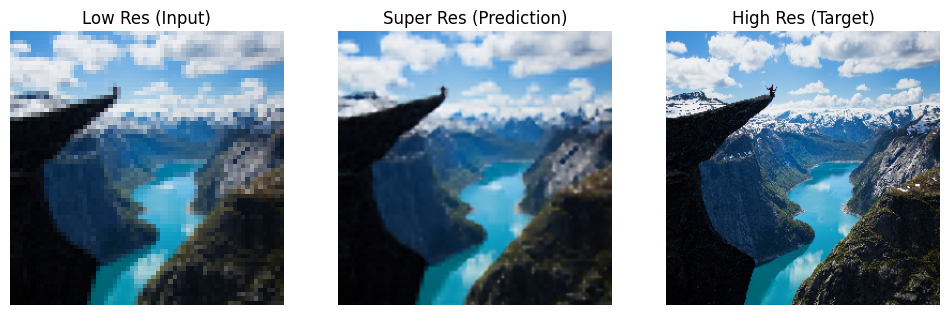

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.08953438..1.0318693].


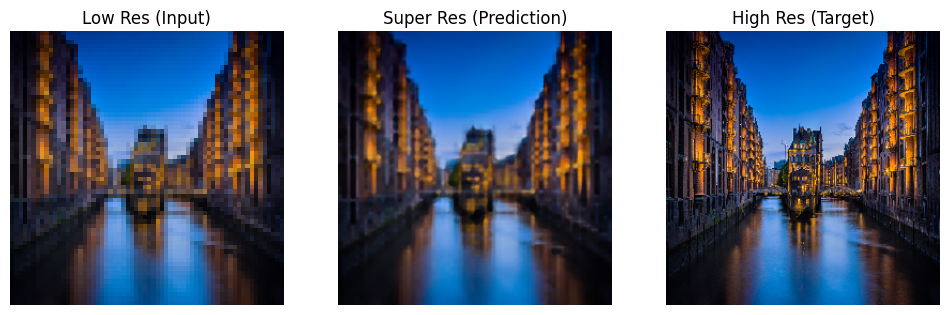

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.04857309..1.0208144].


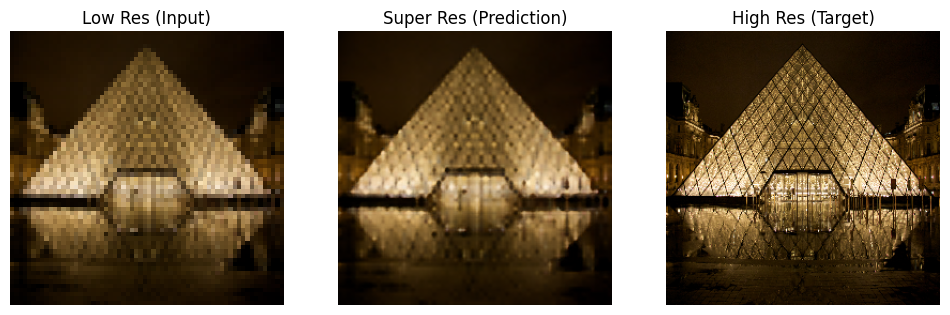

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.018574111..1.0908959].


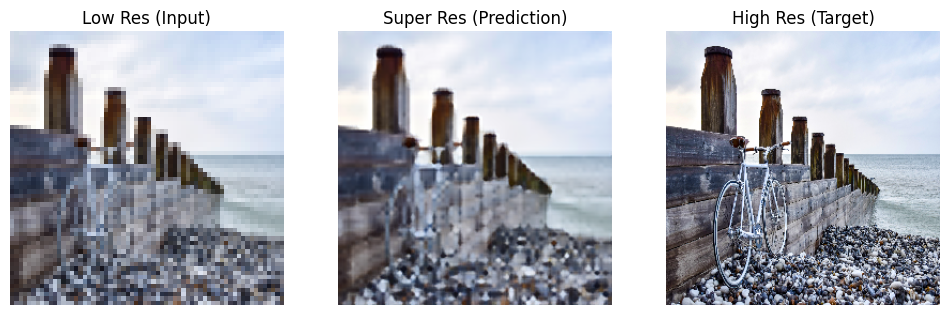

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.03983667..1.0312845].


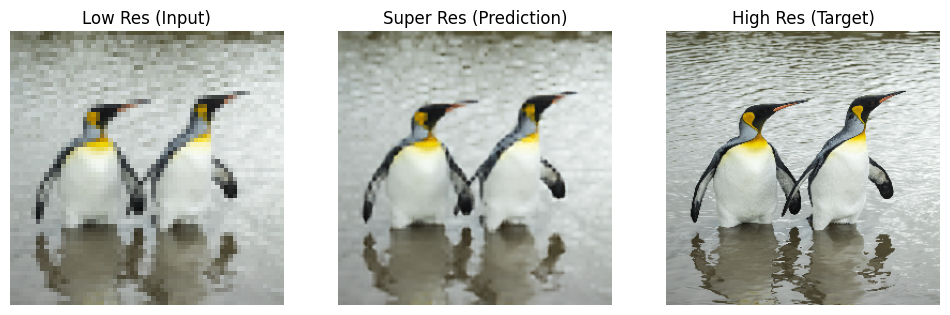

In [24]:
# Mostrar tantos ejemplos como quieras
for _ in range(5):
    show_example(model, train_ds, up_ratio=UP_RATIO)

In [28]:
model.save(filepath="./CNN_x2.keras")